# SPRM Demo - Spatial Process & Relationship Modeling

This notebook provides a comprehensive demo of SPRM

## What this notebook does:

1. **Installs SPRM if needed** with all dependencies
2. **Runs the SPRM analysis** on demo data
3. **Displays results** with interactive visualizations

## Prerequisites:
- Download demo files from: https://drive.google.com/drive/folders/1denyZ1SFoWpWrPO9UbSdcF2DvHEv6ovN?usp=sharing
- Place `image_demo.ome.tiff` in the `img/` folder and `mask_demo.ome.tiff` in the `mask/` folder

## Step 1: Environment Setup and Installation

The following cell will:
- Install SPRM and all dependencies if needed
- Set up matplotlib backend for compatibility

**Note**: Jupyter notebooks automatically use the Python environment of the selected kernel. Make sure you're using a kernel with the SPRM environment activated.

In [2]:
import os
import sys
import subprocess
import importlib
from pathlib import Path

# Colors for output
class Colors:
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'

def print_status(message):
    print(f"{Colors.BLUE}[INFO]{Colors.ENDC} {message}")

def print_success(message):
    print(f"{Colors.GREEN}[SUCCESS]{Colors.ENDC} {message}")

def print_warning(message):
    print(f"{Colors.YELLOW}[WARNING]{Colors.ENDC} {message}")

def print_error(message):
    print(f"{Colors.RED}[ERROR]{Colors.ENDC} {message}")

def setup_notebook_environment():
    """Setup notebook environment for SPRM"""
    print_status("Setting up notebook environment...")
    
    # Check if we're in the right directory
    if not (Path("../setup.py").exists() and Path("../sprm").exists()):
        print_error("Please run this notebook from the demo directory")
        return False
    
    # Set matplotlib backend to avoid GUI issues
    os.environ['MPLBACKEND'] = 'Agg'
    print_status("Set matplotlib backend to Agg (non-GUI)")
    
    # Try to import SPRM
    try:
        import sprm
        print_success("SPRM is available in this kernel")
        return True
    except ImportError:
        print_warning("SPRM not found in this kernel")
        print_status("Installing SPRM from parent directory...")
        
        try:
            result = subprocess.run([
                sys.executable, "-m", "pip", "install", ".."
            ], cwd="..", capture_output=True, text=True, check=True)
            
            print_success("SPRM installed successfully!")
            
            # Try importing again
            import sprm
            print_success("SPRM import successful after installation")
            return True
            
        except subprocess.CalledProcessError as e:
            print_error(f"Failed to install SPRM: {e.stderr}")
            print_error("Please install SPRM manually: pip install ..")
            return False
        except ImportError as e:
            print_error(f"SPRM import failed after installation: {e}")
            return False

# Run the setup
if setup_notebook_environment():
    print_success("Notebook environment ready!")
    print_status("Note: This notebook uses the kernel's Python environment")
else:
    print_error("Environment setup failed. Please check the errors above.")


[INFO] Setting up notebook environment...
[INFO] Set matplotlib backend to Agg (non-GUI)
[SUCCESS] SPRM is available in this kernel
[SUCCESS] Notebook environment ready!
[INFO] Note: This notebook uses the kernel's Python environment


## Step 2: Check Demo Files and Run SPRM Analysis

The following cell will:
- Verify that demo files are present
- Run SPRM analysis with proper error handling
- Generate all output files and visualizations


In [3]:
def check_demo_files():
    """Check if demo files exist"""
    print_status("Checking for demo files...")
    
    # Check for image file in img/ subdirectory
    if not Path("img/image_demo.ome.tiff").exists():
        print_error("Demo image file 'img/image_demo.ome.tiff' not found!")
        print_error("Please download demo files from:")
        print_error("https://drive.google.com/drive/folders/1denyZ1SFoWpWrPO9UbSdcF2DvHEv6ovN?usp=sharing")
        print_error("and place them in the img/ and mask/ subdirectories")
        return False
    
    # Check for mask file in mask/ subdirectory
    if not Path("mask/mask_demo.ome.tiff").exists():
        print_error("Demo mask file 'mask/mask_demo.ome.tiff' not found!")
        print_error("Please download demo files from:")
        print_error("https://drive.google.com/drive/folders/1denyZ1SFoWpWrPO9UbSdcF2DvHEv6ovN?usp=sharing")
        print_error("and place them in the img/ and mask/ subdirectories")
        return False
    
    print_success("Demo files found in img/ and mask/ directories")
    return True

def run_sprm_analysis():
    """Run SPRM analysis on demo files"""
    print_status("Starting SPRM analysis...")
    
    # Create output directory
    output_dir = Path("sprm_demo_outputs")
    output_dir.mkdir(exist_ok=True)
    
    # Define SPRM command
    sprm_path = "../SPRM.py"
    cmd = [
        sys.executable, "-u", sprm_path,
        "--img-dir", "img/image_demo.ome.tiff",
        "--mask-dir", "mask/mask_demo.ome.tiff", 
        "--output-dir", "sprm_demo_outputs",
        "--processes", "1"
    ]
    
    print_status(f"Running command: {' '.join(cmd)}")
    
    try:
        # Run SPRM with real-time output
        process = subprocess.Popen(
            cmd,
            stdout=subprocess.PIPE,
            stderr=subprocess.STDOUT,
            text=True,
            bufsize=1,
            universal_newlines=True
        )
        
        # Print output in real-time
        for line in process.stdout:
            print(line.rstrip())
        
        process.wait()
        
        if process.returncode == 0:
            print_success("SPRM analysis completed successfully!")
            print_status("Results saved to: sprm_demo_outputs/")
            return True
        else:
            print_error(f"SPRM analysis failed with return code: {process.returncode}")
            return False
            
    except Exception as e:
        print_error(f"Error running SPRM: {e}")
        return False

# Check demo files and run analysis
if check_demo_files():
    if run_sprm_analysis():
        print_success("SPRM demo completed successfully!")
    else:
        print_error("SPRM analysis failed. Check the output above for details.")
else:
    print_error("Demo files not found. Please download and place them correctly.")


[INFO] Checking for demo files...
[SUCCESS] Demo files found in img/ and mask/ directories
[INFO] Starting SPRM analysis...
[INFO] Running command: /opt/anaconda3/envs/SPRM/bin/python -u ../SPRM.py --img-dir img/image_demo.ome.tiff --mask-dir mask/mask_demo.ome.tiff --output-dir sprm_demo_outputs --processes 1
SPRM R1.5.2-3-g1d44deaa75d7-dirty
Using 1 worker(s) with executor ThreadPoolExecutor
Reading in image and corresponding mask file...
Image name: image_demo.ome.tiff
Attempted file (/Users/tedzhang/Desktop/CMU/hubmap/SPRM/demo/img/image_demo.ome.tiff) load with reader: aicsimageio.readers.bfio_reader.OmeTiledTiffReader failed with error: No module named 'bfio'
Channel names:
['CD31', 'CD45', 'CD8', 'DAPI_2']
Attempted file (/Users/tedzhang/Desktop/CMU/hubmap/SPRM/demo/mask/mask_demo.ome.tiff) load with reader: aicsimageio.readers.bfio_reader.OmeTiledTiffReader failed with error: No module named 'bfio'
Channel names:
['cells', 'nuclei', 'cell_boundaries', 'nucleus_boundaries']
Calc

## Step 3: Display SPRM Results

The following cells will display the generated results:
- **PDF files**: Adjacency graphs and other visualizations
- **PNG images**: Cell clustering results and analysis plots

In [3]:
# Install PyMuPDF for PDF to image conversion (if needed)
import subprocess
import sys
import os

def check_environment():
    """Check which Python environment we're using"""
    print(f"🐍 Python executable: {sys.executable}")
    print(f"📁 Python path: {sys.path[0]}")
    
    # Check if we're in a conda environment
    conda_env = os.environ.get('CONDA_DEFAULT_ENV', 'Not in conda env')
    print(f"🌍 Conda environment: {conda_env}")
    
    # Check if we're in the SPRM environment specifically
    if 'SPRM' in sys.executable:
        print("✅ Using SPRM conda environment!")
    else:
        print("⚠️  Warning: Not using SPRM environment")
        print(f"   Current environment: {conda_env}")
        print("   Expected: SPRM")

def install_package(package_name):
    """Install a package using pip in the current environment"""
    print(f"📦 Installing {package_name}...")
    try:
        # Use the same Python executable that Jupyter is using
        result = subprocess.check_call([sys.executable, "-m", "pip", "install", package_name])
        print(f"✅ {package_name} installed successfully!")
        return True
    except subprocess.CalledProcessError as e:
        print(f"❌ Failed to install {package_name}: {e}")
        return False

# Check environment first
check_environment()

# Check if PyMuPDF is already installed
try:
    import fitz
    print("✅ PyMuPDF is already installed!")
except ImportError:
    print("📦 PyMuPDF not found. Installing...")
    install_package("PyMuPDF")


🐍 Python executable: /opt/anaconda3/envs/SPRM/bin/python
📁 Python path: /opt/anaconda3/envs/SPRM/lib/python39.zip
🌍 Conda environment: SPRM
✅ Using SPRM conda environment!
📦 PyMuPDF not found. Installing...
📦 Installing PyMuPDF...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 34.2 MB/s  0:00:00 eta 0:00:01
✅ PyMuPDF installed successfully!


In [4]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import IFrame

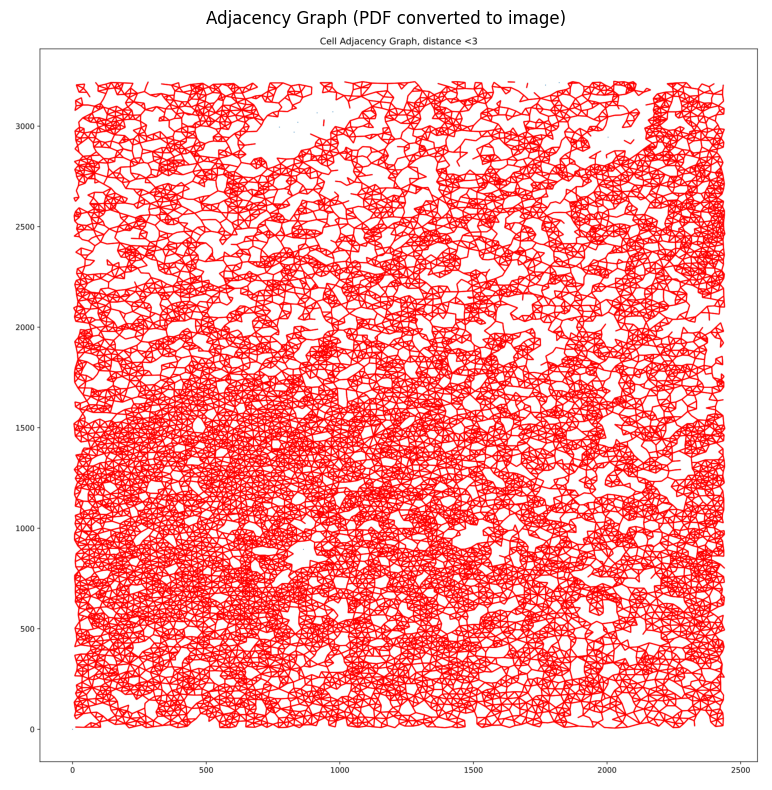

✅ PDF converted to image and displayed


In [ ]:
# Path to the PDF file
pdf_path = "sprm_demo_outputs/image_demo.ome.tiff_AdjacencyGraph.pdf"

try:
    import fitz  # PyMuPDF
    import matplotlib.pyplot as plt
    from IPython.display import display
    
    # Open PDF and convert to image
    doc = fitz.open(pdf_path)
    page = doc[0]  # Get first page
    pix = page.get_pixmap(matrix=fitz.Matrix(2, 2))  # 2x zoom for better quality
    img_data = pix.tobytes("png")
    
    # Display as image
    from PIL import Image
    import io
    img = Image.open(io.BytesIO(img_data))
    
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Adjacency Graph (PDF converted to image)')
    plt.tight_layout()
    plt.show()
    
    doc.close()
    print("✅ PDF converted to image and displayed")
    
except ImportError:
    print("❌ PyMuPDF not available. Install with: pip install PyMuPDF")
    
    # Method 3: Display file path for manual opening
    import os
    abs_path = os.path.abspath(pdf_path)
    print(f"📄 PDF file location: {abs_path}")
    print("💡 You can open this file manually in your PDF viewer")
    
    # Method 4: Show file info
    if os.path.exists(pdf_path):
        file_size = os.path.getsize(pdf_path) / 1024  # KB
        print(f"📊 File size: {file_size:.1f} KB")
        print(f"📁 Relative path: {pdf_path}")
    else:
        print(f"❌ File not found: {pdf_path}")


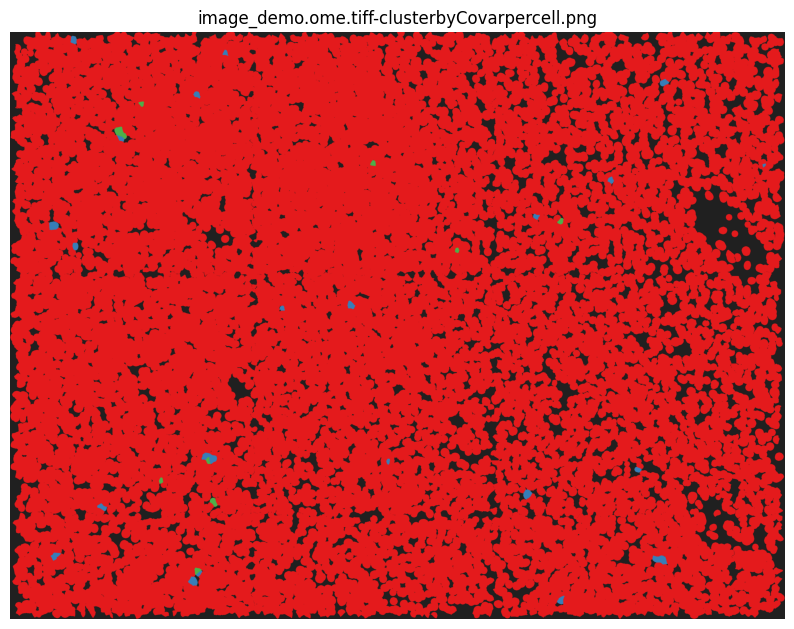

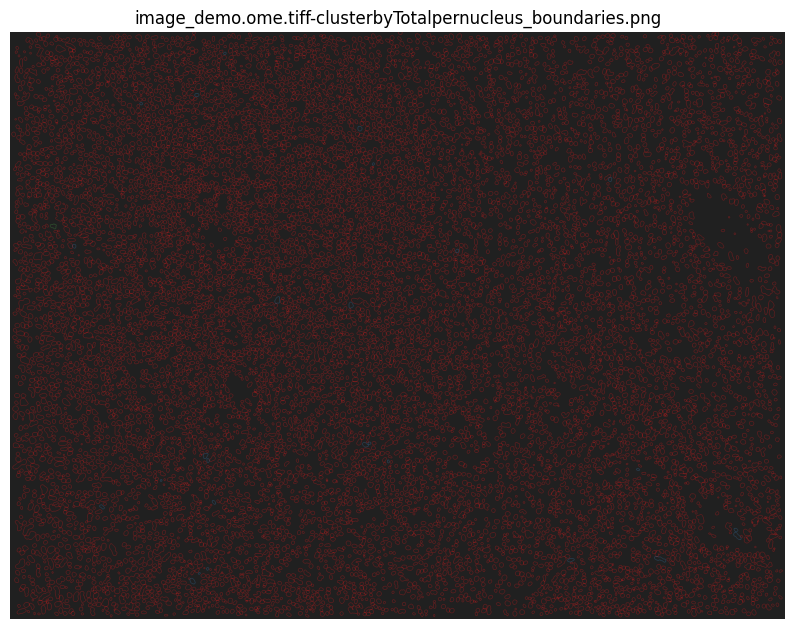

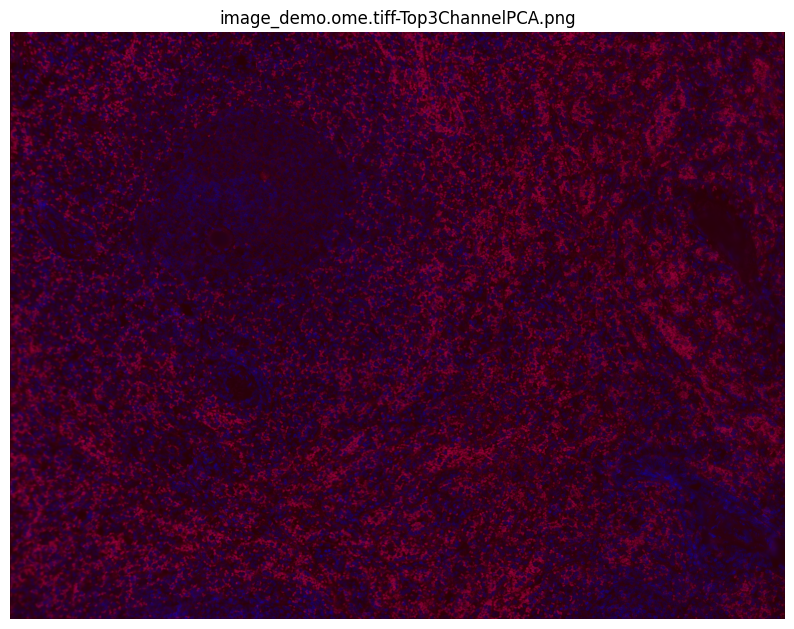

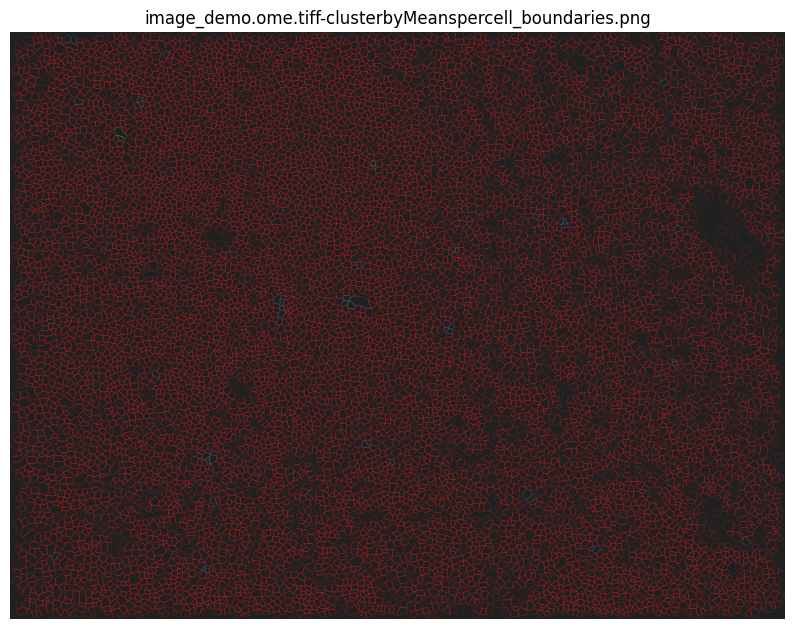

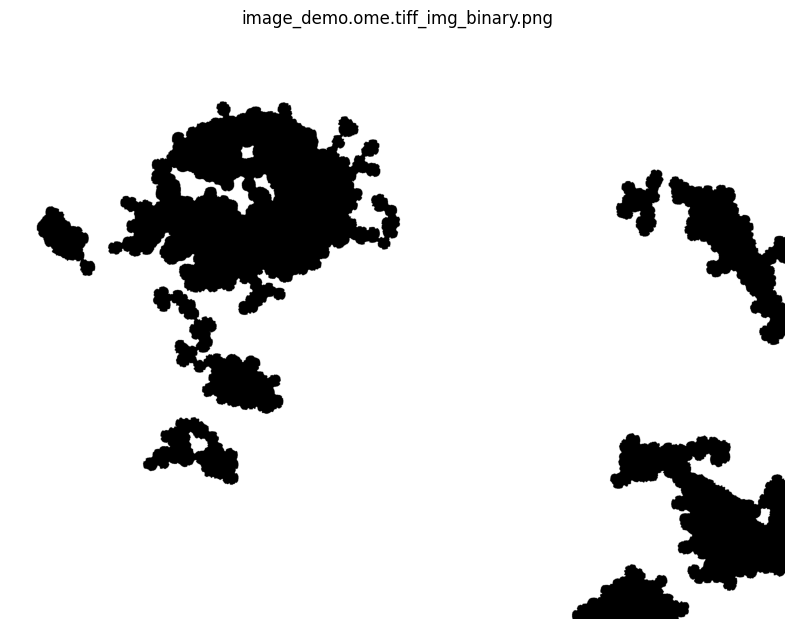

...

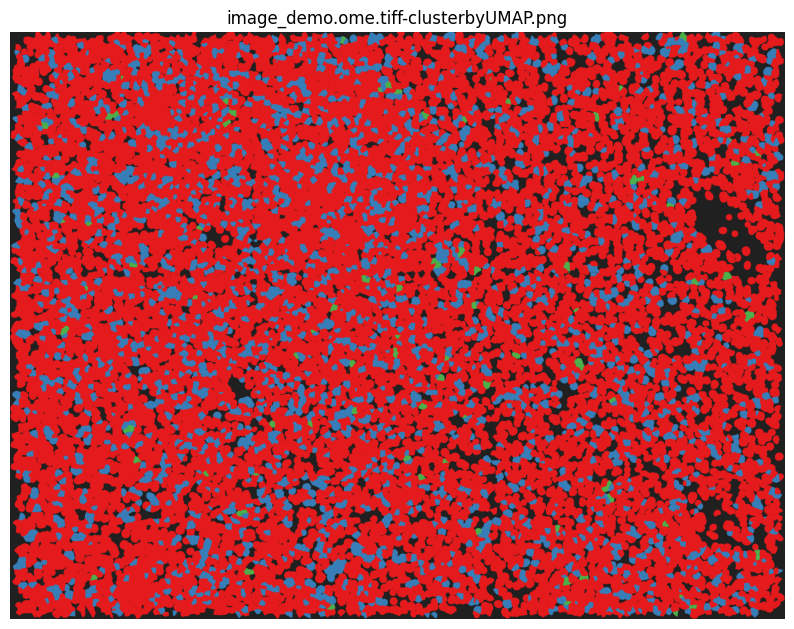

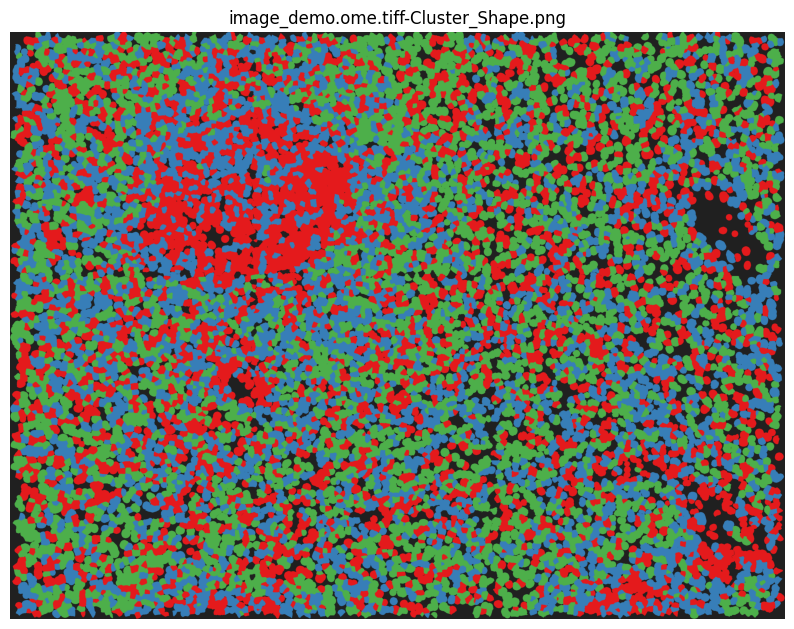

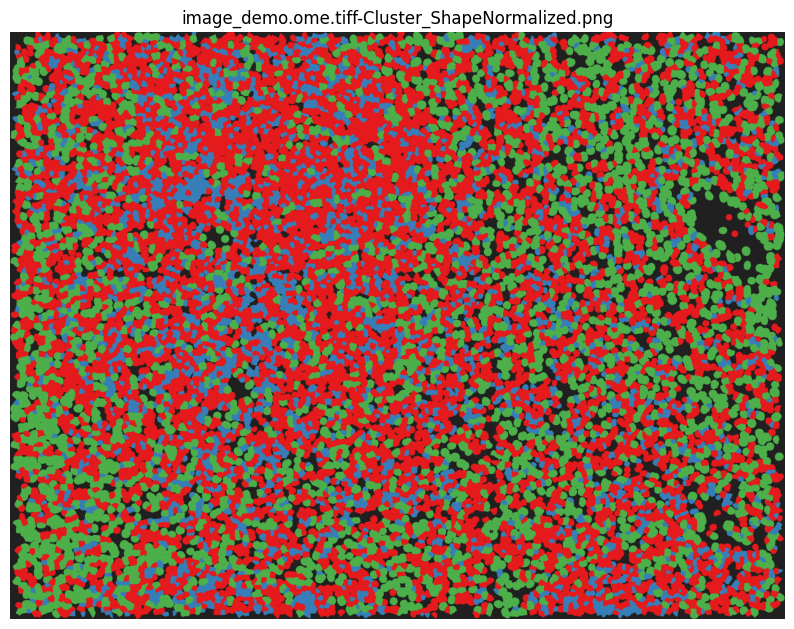

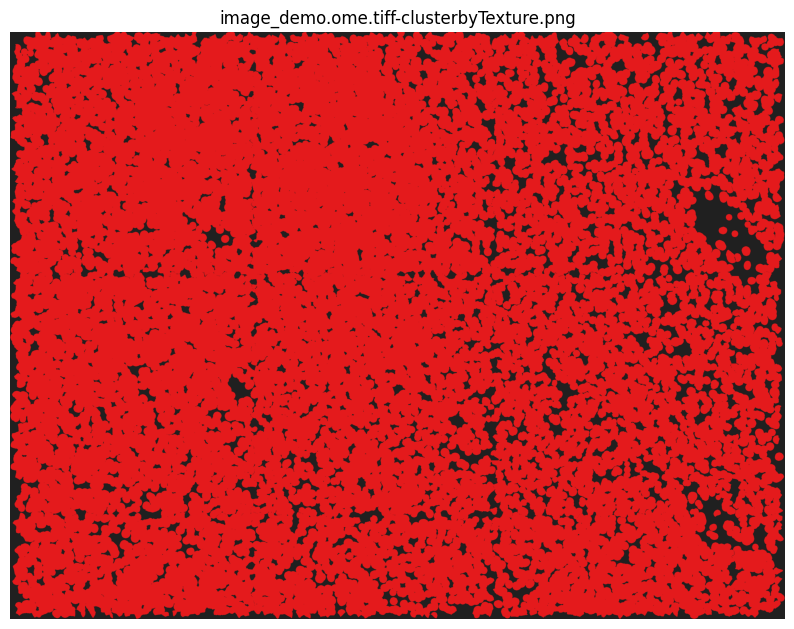

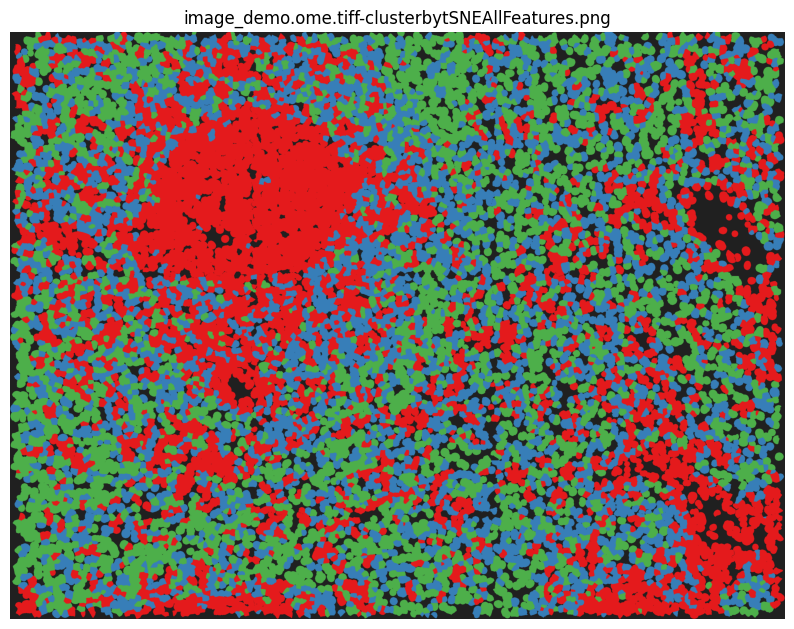

In [12]:
# Path to the folder containing the PNG images
folder_path = "sprm_demo_outputs"

# Get all files in the folder
files = os.listdir(folder_path)

# Filter PNG files
png_files = [file for file in files if file.endswith('.png')]

# Display the PNG images
for png_file in png_files:
    image_path = os.path.join(folder_path, png_file)
    image = Image.open(image_path)
    plt.figure()
    plt.imshow(image)
    plt.title(png_file)
    plt.axis('off')
    plt.show()